In [63]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import os
import numpy as np
import pandas as pd
import anndata as ad 
import squidpy as sq
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sb
import scvi 
import torch #pytorch
import runpy
import pickle
from datetime import datetime
import celltypist
from celltypist import models
import re

from os import sys
sys.path.append('/tmp/work/Visium/BRCA_2024/brca_scripts')
from visiumPipeline import processVisium
from applyCosineScores import cosineScores
from tumorSegmentation import retrieveTumorMask
from getRSigs import getRSigs
from py_AUCell import AUCell

sc.set_figure_params(figsize=(4,4))
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

#gettting model for celltypist
models.download_models(force_update = True)
model = models.Model.load(model = 'Immune_All_Low.pkl')

#define sample poths, sample names and emptry dictionary

samples = ['2018838/PRE-01','2018838/PRE-02','2018838/POST-03','2018838/POST-05',
           '2018839/PRE-04','2018839/PRE-05','2018839/POST-06','2018839/POST-11']

# create pseudobulk profile
result = runpy.run_path('/tmp/work/Visium/BRCA_2024/brca_scripts/acquirePseudoBulkRef.py')
# read pseudobulk to variable
pb_df = pd.read_pickle('wu_2021_pseudobulk.pkl')

#grab the gene signatures
signatures_dict, signature_groups_list = getRSigs()

sample_names = [os.path.basename(sample) for sample in samples]
visium_samples = variables = {name: None for name in sample_names} #variable names associated with emptry values in dictionary for storing data later

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 52
📂 Storing models in /root/.celltypist/data/models
💾 Downloading model [1/52]: Immune_All_Low.pkl
💾 Downloading model [2/52]: Immune_All_High.pkl
💾 Downloading model [3/52]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/52]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/52]: Adult_Human_MTG.pkl
💾 Downloading model [6/52]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [7/52]: Adult_Human_PrefrontalCortex.pkl
💾 Downloading model [8/52]: Adult_Human_Skin.pkl
💾 Downloading model [9/52]: Adult_Mouse_Gut.pkl
💾 Downloading model [10/52]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [11/52]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [12/52]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [13/52]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [14/52]: COVID19_HumanChallenge_Blood.pkl
💾 Downloading model [15/52]: COVID19_Immune_Landscape.pkl

normalizing counts per cell
    finished (0:00:01)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:03)
normalizing counts per cell
    finished (0:00:00)


querying 1-11...
done.
Finished.
querying 1-7...
done.
Finished.
querying 1-4...
done.
Finished.
querying 1-3...
done.
Finished.
querying 1-12...
done.
Finished.
1 input query terms found dup hits:	[('ENSG00000072694', 2)]
Pass "returnall=True" to return complete lists of duplicate or missing query terms.
querying 1-3...
done.
Finished.
querying 1-4...
done.
Finished.
1 input query terms found dup hits:	[('ENSG00000165025', 2)]
1 input query terms found no hit:	['None']
Pass "returnall=True" to return complete lists of duplicate or missing query terms.
querying 1-16...
done.
Finished.
querying 1-16...
done.
Finished.
querying 1-7...
done.
Finished.
querying 1-10...
done.
Finished.
querying 1-5...
done.
Finished.
querying 1-7...
done.
Finished.
querying 1-10...
done.
Finished.
1 input query terms found no hit:	['ENSG00000112096']
Pass "returnall=True" to return complete lists of duplicate or missing query terms.
querying 1-12...
done.
Finished.
1 input query terms found no hit:	['ENSG00

In [64]:
import importlib
import sys

# Add the path where your custom module is located
sys.path.append('/tmp/work/Visium/BRCA_2024/brca_scripts')

# Import the module
import py_AUCell

# Now reload the module
importlib.reload(py_AUCell)
#process each of the samples

start_time = datetime.now()

for i in range(len(samples)):
    print('\n')
    print('Initial Processing of:'+sample_names[i])
    print('\n')
    visium_samples[sample_names[i]] = processVisium(samples[i],model)
    print('\n')
    print('Applying cosine similiarities for:'+sample_names[i])
    print('\n')
    visium_samples[sample_names[i]] = cosineScores(visium_samples[sample_names[i]],pb_df)  # apply cosine similarites
    print('\n')
    print('Applying gene signatures scores for:'+sample_names[i])
    print('\n')
    visium_samples[sample_names[i]] = AUCell(visium_samples[sample_names[i]],signatures_dict,signature_groups_list)  #apply gene signatures scores
    
end_time = datetime.now()
execution_time = end_time - start_time
print('\n')
print(f"Execution time: {execution_time}")

#save the file for later use
with open('visium_samples_inclusive.pkl', 'wb') as file:
    pickle.dump(visium_samples, file)



Initial Processing of:PRE-01


/tmp/work/Visium/2018838/PRE-01
reading /tmp/work/Visium/2018838/PRE-01/filtered_feature_bc_matrix.h5
 (0:00:01)
filtered out 14 cells that have less than 600 counts
filtered out 2 cells that have less than 500 genes expressed
filtered out 66 genes that are detected in less than 10 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP


🔬 Input data has 4712 cells and 18019 genes
🔗 Matching reference genes in the model
🧬 5045 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 55 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Applying cosine similiarities for:PRE-01


Valid columns: 906
Missing columns: 94


Applying gene signatures scores for:PRE-01




Current sig:
Messina_chemokine
Original length is  11
After filtering the length is  11




Current sig:
Cabrita_tls
Original length is  7
After filtering the length is  7




Current sig:
Goff_Cell proliferation
Original length is  4
After filtering the length is  4




Current sig:
Goff_Myeloid inflammatory
Original length is  3
After filtering the length is  3




Current sig:
Goff_Agpresentation
Original length is  12
After filtering the length is  7




Current sig:
Goff_B cells
Original length is  3
After filtering the length is  3




Current sig:
Goff_NK cells
Original length is  4
After filtering the length is  3




Current sig:
Zhang_hM01_Mast-TPSAB1
Original length is  16
After filtering the length is  14




Current sig:
Zhang_hM02_pDC-LILRA4
Original length is  16
After filtering the length is  13




Current sig:
Zhang_hM03_cDC2-CD1C
Origin

🔬 Input data has 4949 cells and 18015 genes
🔗 Matching reference genes in the model
🧬 5046 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 63 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Applying cosine similiarities for:PRE-02


Valid columns: 922
Missing columns: 78


Applying gene signatures scores for:PRE-02




Current sig:
Messina_chemokine
Original length is  11
After filtering the length is  11




Current sig:
Cabrita_tls
Original length is  7
After filtering the length is  7




Current sig:
Goff_Cell proliferation
Original length is  4
After filtering the length is  4




Current sig:
Goff_Myeloid inflammatory
Original length is  3
After filtering the length is  3




Current sig:
Goff_Agpresentation
Original length is  12
After filtering the length is  7




Current sig:
Goff_B cells
Original length is  3
After filtering the length is  3




Current sig:
Goff_NK cells
Original length is  4
After filtering the length is  3




Current sig:
Zhang_hM01_Mast-TPSAB1
Original length is  16
After filtering the length is  14




Current sig:
Zhang_hM02_pDC-LILRA4
Original length is  16
After filtering the length is  13




Current sig:
Zhang_hM03_cDC2-CD1C
Origin

🔬 Input data has 3837 cells and 18018 genes
🔗 Matching reference genes in the model
🧬 5045 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 67 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Applying cosine similiarities for:POST-03


Valid columns: 919
Missing columns: 81


Applying gene signatures scores for:POST-03




Current sig:
Messina_chemokine
Original length is  11
After filtering the length is  11




Current sig:
Cabrita_tls
Original length is  7
After filtering the length is  7




Current sig:
Goff_Cell proliferation
Original length is  4
After filtering the length is  4




Current sig:
Goff_Myeloid inflammatory
Original length is  3
After filtering the length is  3




Current sig:
Goff_Agpresentation
Original length is  12
After filtering the length is  7




Current sig:
Goff_B cells
Original length is  3
After filtering the length is  3




Current sig:
Goff_NK cells
Original length is  4
After filtering the length is  3




Current sig:
Zhang_hM01_Mast-TPSAB1
Original length is  16
After filtering the length is  14




Current sig:
Zhang_hM02_pDC-LILRA4
Original length is  16
After filtering the length is  13




Current sig:
Zhang_hM03_cDC2-CD1C
Orig

🔬 Input data has 4694 cells and 18025 genes
🔗 Matching reference genes in the model
🧬 5045 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 49 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Applying cosine similiarities for:POST-05


Valid columns: 888
Missing columns: 112


Applying gene signatures scores for:POST-05




Current sig:
Messina_chemokine
Original length is  11
After filtering the length is  11




Current sig:
Cabrita_tls
Original length is  7
After filtering the length is  7




Current sig:
Goff_Cell proliferation
Original length is  4
After filtering the length is  4




Current sig:
Goff_Myeloid inflammatory
Original length is  3
After filtering the length is  3




Current sig:
Goff_Agpresentation
Original length is  12
After filtering the length is  7




Current sig:
Goff_B cells
Original length is  3
After filtering the length is  3




Current sig:
Goff_NK cells
Original length is  4
After filtering the length is  3




Current sig:
Zhang_hM01_Mast-TPSAB1
Original length is  16
After filtering the length is  14




Current sig:
Zhang_hM02_pDC-LILRA4
Original length is  16
After filtering the length is  13




Current sig:
Zhang_hM03_cDC2-CD1C
Ori

🔬 Input data has 4766 cells and 17969 genes
🔗 Matching reference genes in the model
🧬 5045 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 64 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Applying cosine similiarities for:PRE-04


Valid columns: 914
Missing columns: 86


Applying gene signatures scores for:PRE-04




Current sig:
Messina_chemokine
Original length is  11
After filtering the length is  11




Current sig:
Cabrita_tls
Original length is  7
After filtering the length is  7




Current sig:
Goff_Cell proliferation
Original length is  4
After filtering the length is  4




Current sig:
Goff_Myeloid inflammatory
Original length is  3
After filtering the length is  3




Current sig:
Goff_Agpresentation
Original length is  12
After filtering the length is  7




Current sig:
Goff_B cells
Original length is  3
After filtering the length is  3




Current sig:
Goff_NK cells
Original length is  4
After filtering the length is  3




Current sig:
Zhang_hM01_Mast-TPSAB1
Original length is  16
After filtering the length is  14




Current sig:
Zhang_hM02_pDC-LILRA4
Original length is  16
After filtering the length is  13




Current sig:
Zhang_hM03_cDC2-CD1C
Origin

🔬 Input data has 4791 cells and 17963 genes
🔗 Matching reference genes in the model
🧬 5045 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 53 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Applying cosine similiarities for:PRE-05


Valid columns: 928
Missing columns: 72


Applying gene signatures scores for:PRE-05




Current sig:
Messina_chemokine
Original length is  11
After filtering the length is  11




Current sig:
Cabrita_tls
Original length is  7
After filtering the length is  7




Current sig:
Goff_Cell proliferation
Original length is  4
After filtering the length is  4




Current sig:
Goff_Myeloid inflammatory
Original length is  3
After filtering the length is  3




Current sig:
Goff_Agpresentation
Original length is  12
After filtering the length is  7




Current sig:
Goff_B cells
Original length is  3
After filtering the length is  3




Current sig:
Goff_NK cells
Original length is  4
After filtering the length is  3




Current sig:
Zhang_hM01_Mast-TPSAB1
Original length is  16
After filtering the length is  14




Current sig:
Zhang_hM02_pDC-LILRA4
Original length is  16
After filtering the length is  13




Current sig:
Zhang_hM03_cDC2-CD1C
Origin

🔬 Input data has 4710 cells and 18024 genes
🔗 Matching reference genes in the model
🧬 5044 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 58 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Applying cosine similiarities for:POST-06


Valid columns: 894
Missing columns: 106


Applying gene signatures scores for:POST-06




Current sig:
Messina_chemokine
Original length is  11
After filtering the length is  11




Current sig:
Cabrita_tls
Original length is  7
After filtering the length is  7




Current sig:
Goff_Cell proliferation
Original length is  4
After filtering the length is  4




Current sig:
Goff_Myeloid inflammatory
Original length is  3
After filtering the length is  3




Current sig:
Goff_Agpresentation
Original length is  12
After filtering the length is  7




Current sig:
Goff_B cells
Original length is  3
After filtering the length is  3




Current sig:
Goff_NK cells
Original length is  4
After filtering the length is  3




Current sig:
Zhang_hM01_Mast-TPSAB1
Original length is  16
After filtering the length is  14




Current sig:
Zhang_hM02_pDC-LILRA4
Original length is  16
After filtering the length is  13




Current sig:
Zhang_hM03_cDC2-CD1C
Ori

🔬 Input data has 4009 cells and 17999 genes
🔗 Matching reference genes in the model
🧬 5041 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5


running Leiden clustering
    finished: found 84 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:00)


🗳️ Majority voting the predictions
✅ Majority voting done!




Applying cosine similiarities for:POST-11


Valid columns: 906
Missing columns: 94


Applying gene signatures scores for:POST-11




Current sig:
Messina_chemokine
Original length is  11
After filtering the length is  11




Current sig:
Cabrita_tls
Original length is  7
After filtering the length is  7




Current sig:
Goff_Cell proliferation
Original length is  4
After filtering the length is  4




Current sig:
Goff_Myeloid inflammatory
Original length is  3
After filtering the length is  3




Current sig:
Goff_Agpresentation
Original length is  12
After filtering the length is  7




Current sig:
Goff_B cells
Original length is  3
After filtering the length is  3




Current sig:
Goff_NK cells
Original length is  4
After filtering the length is  3




Current sig:
Zhang_hM01_Mast-TPSAB1
Original length is  16
After filtering the length is  14




Current sig:
Zhang_hM02_pDC-LILRA4
Original length is  16
After filtering the length is  13




Current sig:
Zhang_hM03_cDC2-CD1C
Orig

In [65]:
with open('visium_samples_inclusive.pkl', 'rb') as file:
    visium_samples = pickle.load(file)

for_concat = dict(zip(samples, visium_samples.values()))
adatas = ad.concat(for_concat, label="dataset_name",  join="outer")

pre_names = ['2018838/PRE-01','2018838/PRE-02', '2018839/PRE-04','2018839/PRE-05']
post_names = ['2018838/POST-03','2018838/POST-05', '2018839/POST-06','2018839/POST-11']

## Sigs vs cos sim

In [66]:
def gene_sig_cos_sim_heatmap(input_names,order = None):
    mask = adatas.obs['dataset_name'].isin(input_names)
    subset_adata = adatas[mask]
    
    sigs_of_interrest_list = ['Goff_B cells', 'Goff_NK cells', 'Yang_Bcells', 'DN2_Bcells', 'Zhang_hM10_Macro-IL1B', 'Zhang_hM08_Macro-NLRP3']

    sigs_of_interrest_list = signature_groups_list
    
    meta_columns = subset_adata.obs.columns.tolist()
    cos_sim_re = [(i, text, re.search('cos_sim', text)) for i, text in enumerate(meta_columns) if re.search('cos_sim', text)]
    
    cos_sim_of_interest_list = [sublist[1] for sublist in cos_sim_re]
    
    # Extract columns from adatas.obs for both lists
    cos_sim_columns = pd.DataFrame({col: subset_adata.obs[col] for col in cos_sim_of_interest_list})
    gene_sig_columns = pd.DataFrame({col: subset_adata.obs[col] for col in sigs_of_interrest_list})
    
    # 1. Ensure both DataFrames have the same number of rows
    if len(cos_sim_columns) != len(gene_sig_columns):
        raise ValueError("The two DataFrames must have the same number of rows.")
    
    # You can either drop rows with NaN values or fill them with a default value (e.g., 0)
    cos_sim_columns.fillna(0, inplace=True)
    gene_sig_columns.fillna(0, inplace=True)
    
    # 3. Ensure the data types are numeric
    cos_sim_columns = cos_sim_columns.apply(pd.to_numeric, errors='coerce')
    gene_sig_columns = gene_sig_columns.apply(pd.to_numeric, errors='coerce')
    
    # Perform correlation between the two DataFrames
    correlation_result = cos_sim_columns.corrwith(gene_sig_columns)
    
    combined_df = pd.concat([cos_sim_columns, gene_sig_columns], axis=1)
    combined_df
    
    df1 = cos_sim_columns
    df2 = gene_sig_columns
    
    correlation_results = pd.DataFrame(index=df1.columns, columns=df2.columns)
    
    # Compute pairwise correlations
    for col1 in df1.columns:
        for col2 in df2.columns:
            correlation_results.loc[col1, col2] = df1[col1].corr(df2[col2])
    
    # Convert to numeric (in case of any non-numeric entries)
    correlation_results = correlation_results.apply(pd.to_numeric)

    if order is None:
        ax = sb.clustermap(correlation_results, annot=None, cmap='coolwarm', center=0, 
                         linewidths=0, rasterized=True, vmin=-.3, vmax=0.6)
        
        ax.ax_row_dendrogram.set_visible(False) #suppress row dendrogram
        ax.ax_col_dendrogram.set_visible(False) #suppress column dendrogram
        ax.ax_heatmap.grid(False)  # Remove grid lines inside the heatmap
        
        # Show the plot
        # plt.show()
        return [ax.dendrogram_row.reordered_ind, ax.dendrogram_col.reordered_ind]

    else:
        correlation_results = correlation_results.iloc[order[0],order[1]]
        
        # Plot heatmap
        plt.figure(figsize=(10, 8))
        ax = sb.heatmap(correlation_results, annot=None, cmap='coolwarm', center=0, 
                         linewidths=0, rasterized=True, vmin=-.3, vmax=0.6)

        ax.grid(False)  # Remove grid lines inside the heatmap

        plt.title('Cell type cos sim vs Gene signature pairwise correlation')
        # plt.show()
        return plt

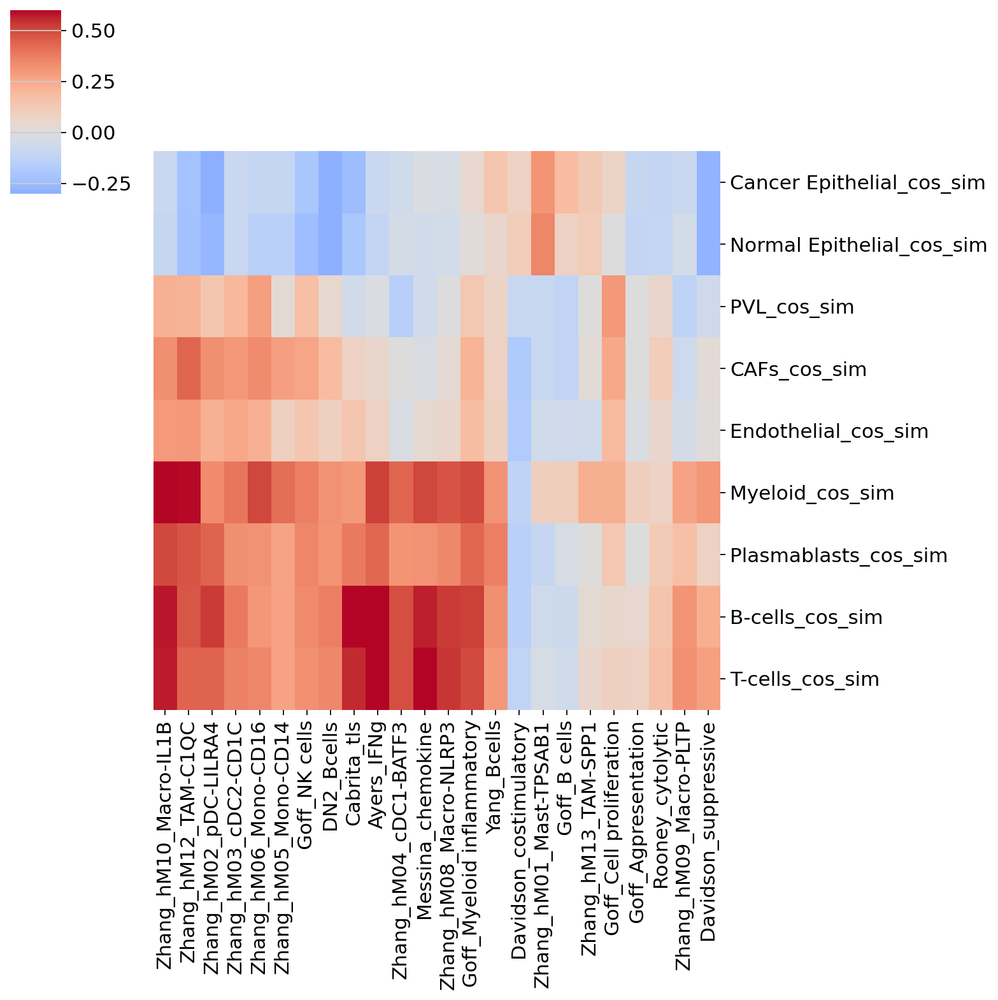

In [67]:
new_order = gene_sig_cos_sim_heatmap(pre_names)

<module 'matplotlib.pyplot' from '/opt/conda/lib/python3.10/site-packages/matplotlib/pyplot.py'>

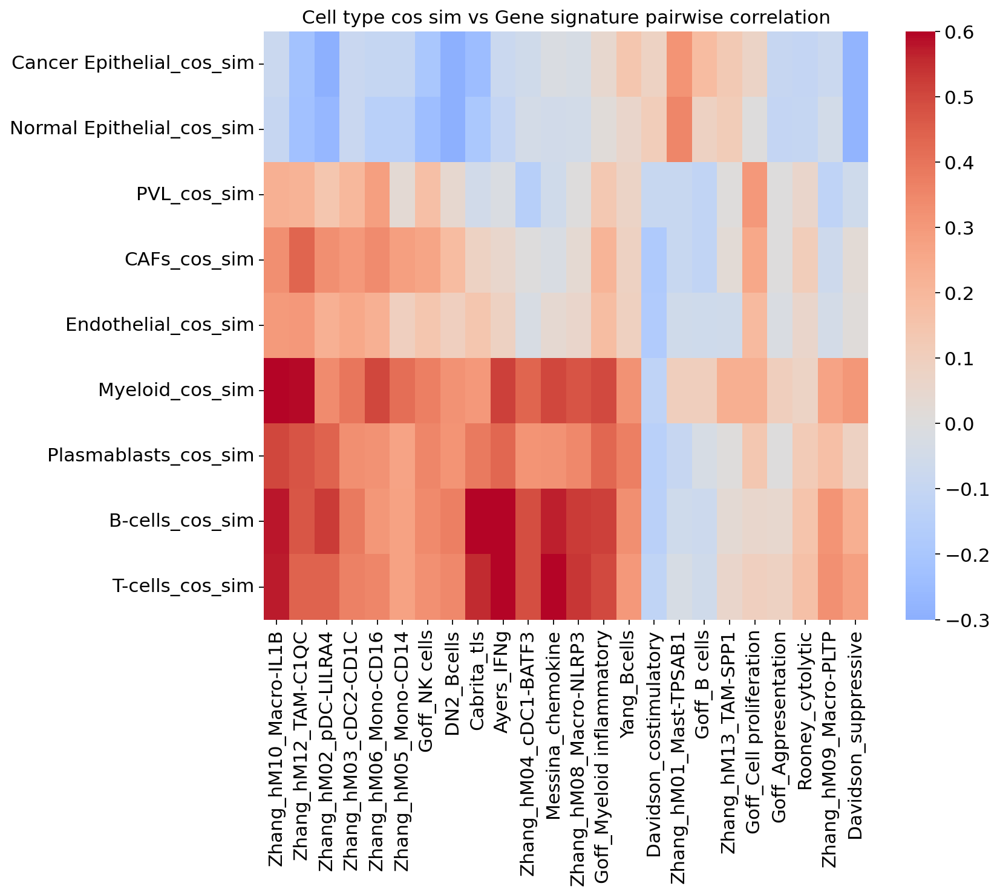

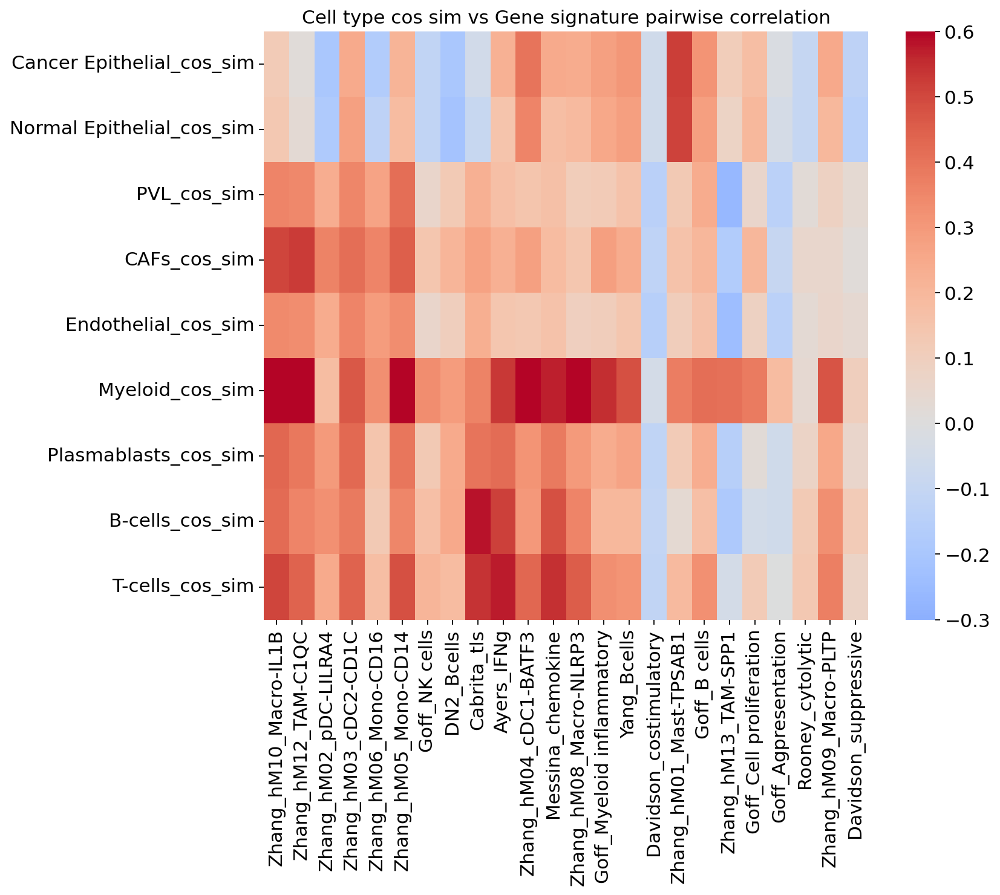

In [68]:
gene_sig_cos_sim_heatmap(pre_names,new_order)
gene_sig_cos_sim_heatmap(post_names,new_order)

## Neighborhood analysis

Creating graph using `generic` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)
Calculating neighborhood enrichment using `1` core(s)


100%|██████████| 1000/1000 [00:00<00:00, 2632.58/s]


Adding `adata.uns['majority_voting_nhood_enrichment']`
Finish (0:00:00)
{'Tem/Trm cytotoxic T cells', 'Endothelial cells', 'Plasma cells', 'Age-associated B cells', 'Epithelial cells', 'Tcm/Naive cytotoxic T cells', 'Naive B cells', 'Fibroblasts', 'Macrophages'}
Creating graph using `generic` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)
Calculating neighborhood enrichment using `1` core(s)


100%|██████████| 1000/1000 [00:00<00:00, 3222.04/s]


Adding `adata.uns['majority_voting_nhood_enrichment']`
Finish (0:00:00)
{'Epithelial cells', 'Endothelial cells', 'Fibroblasts'}


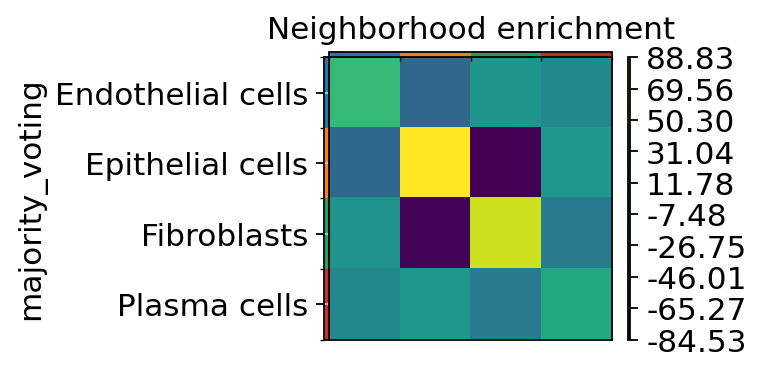

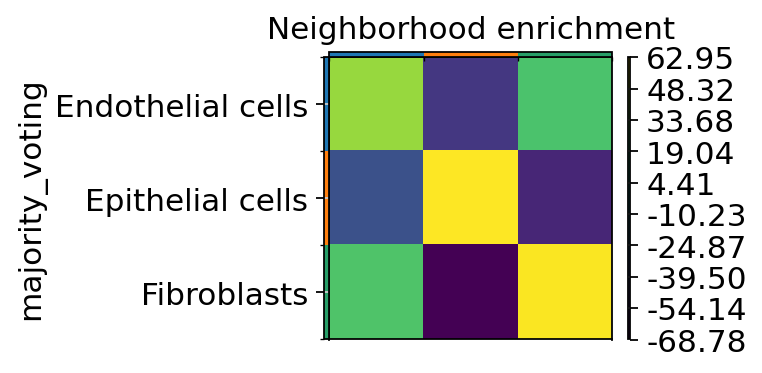

In [69]:
pre_names = ['2018838/PRE-01','2018838/PRE-02', '2018839/PRE-04','2018839/PRE-05']
post_names = ['2018838/POST-03','2018838/POST-05', '2018839/POST-06','2018839/POST-11']

#pre set
mask = adatas.obs['dataset_name'].isin(pre_names[0:1])
subset_adata = adatas[mask]
nan_mask = np.isnan(subset_adata.obsm['spatial']).any(axis=1)
subset_adata = subset_adata[~nan_mask].copy()  # Using '~' to negate the mask (keep only rows without NaNs)
sq.gr.spatial_neighbors(subset_adata)
sq.gr.nhood_enrichment(subset_adata, cluster_key="majority_voting")
sq.pl.nhood_enrichment(subset_adata, cluster_key="majority_voting")

print(set(adatas.obs['majority_voting']))

#post set
mask = adatas.obs['dataset_name'].isin(post_names[0:1])
subset_adata = adatas[mask]
nan_mask = np.isnan(subset_adata.obsm['spatial']).any(axis=1)
subset_adata = subset_adata[~nan_mask].copy()  # Using '~' to negate the mask (keep only rows without NaNs)
sq.gr.spatial_neighbors(subset_adata)
sq.gr.nhood_enrichment(subset_adata, cluster_key="majority_voting")
sq.pl.nhood_enrichment(subset_adata, cluster_key="majority_voting")

print(set(subset_adata.obs['majority_voting']))

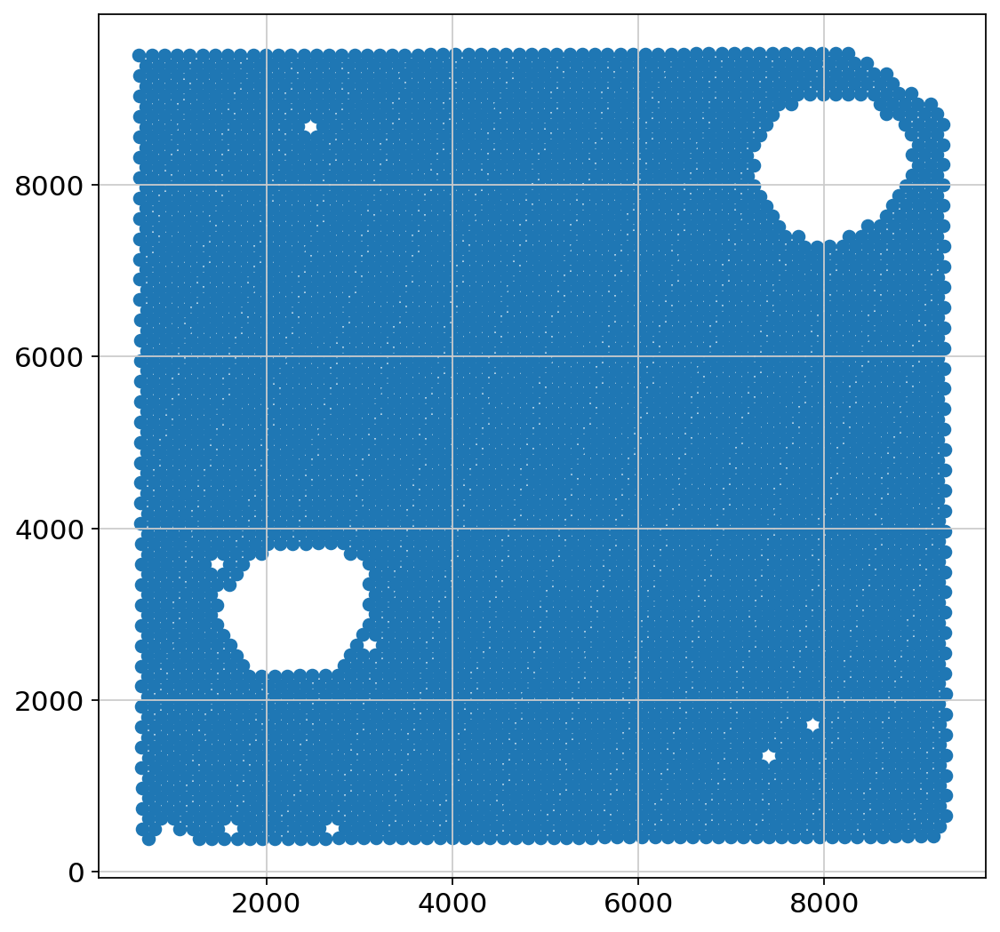

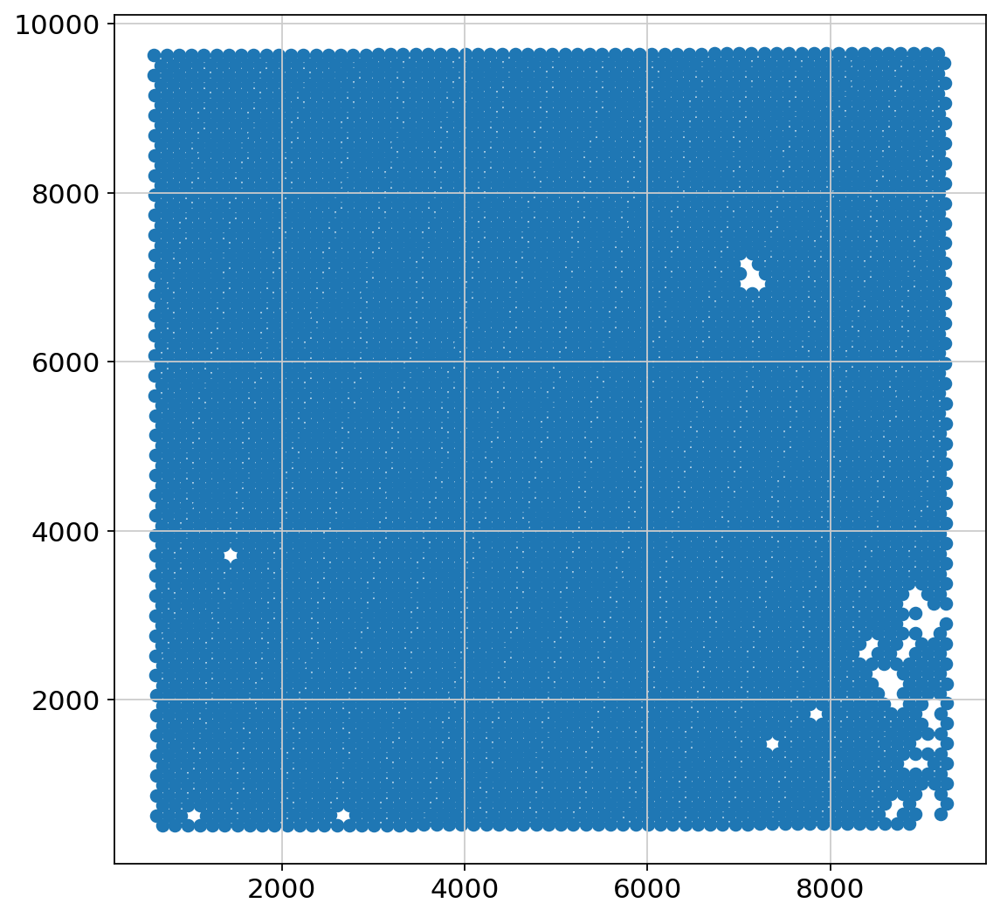

In [78]:
subset_adata = visium_samples['PRE-01']

x = subset_adata.obsm["spatial"][:,0]
y = subset_adata.obsm["spatial"][:,1]

plt.scatter(x = x, y = y)
plt.show()


subset_adata = visium_samples['PRE-02']

x = subset_adata.obsm["spatial"][:,0]
y = subset_adata.obsm["spatial"][:,1]

plt.scatter(x = x, y = y)
plt.show()

In [75]:
# scatter(subset_adata.obsm["spatial"])

plt.scatter(subset_adata.obsm["spatial"])
plt.show()

TypeError: scatter() missing 1 required positional argument: 'y'

In [95]:
subset_adata = visium_samples['PRE-01']

x = subset_adata.obsm["spatial"][:,0]
y = subset_adata.obsm["spatial"][:,1]

y
x

array([7779., 4455., 6361., ..., 5695., 6088.,  646.])

In [100]:
min(subset_adata.obs['array_row'])

0.0

In [88]:
subset_adata = visium_samples['PRE-01']

x = subset_adata.obsm["spatial"][:,0]
y = subset_adata.obsm["spatial"][:,1]
x = x + 1*2000
subset_adata.obsm["spatial"] = np.stack((x, y), axis=0)

sq.gr.spatial_neighbors(subset_adata_clean)
sq.gr.nhood_enrichment(subset_adata_clean, cluster_key="majority_voting")
sq.pl.nhood_enrichment(subset_adata_clean, cluster_key="majority_voting")

adata_test = visium_samples['PRE-01']
sq.pl.spatial_scatter(adata_test, color="majority_voting", alpha = 0.8)

ValueError: Value passed for key 'spatial' is of incorrect shape. Values of obsm must match dimensions ('obs',) of parent. Value had shape (2,) while it should have had (4712,).

Creating graph using `grid` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)
Calculating neighborhood enrichment using `1` core(s)


100%|██████████| 1000/1000 [00:00<00:00, 2832.35/s]


Adding `adata.uns['majority_voting_nhood_enrichment']`
Finish (0:00:00)


... storing 'feature_types' as categorical
... storing 'genome' as categorical


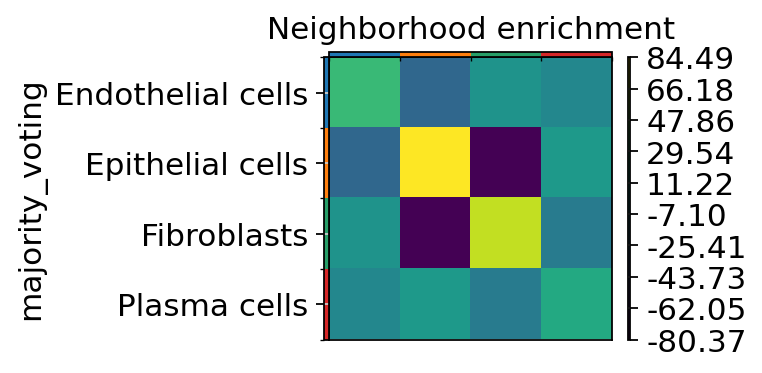

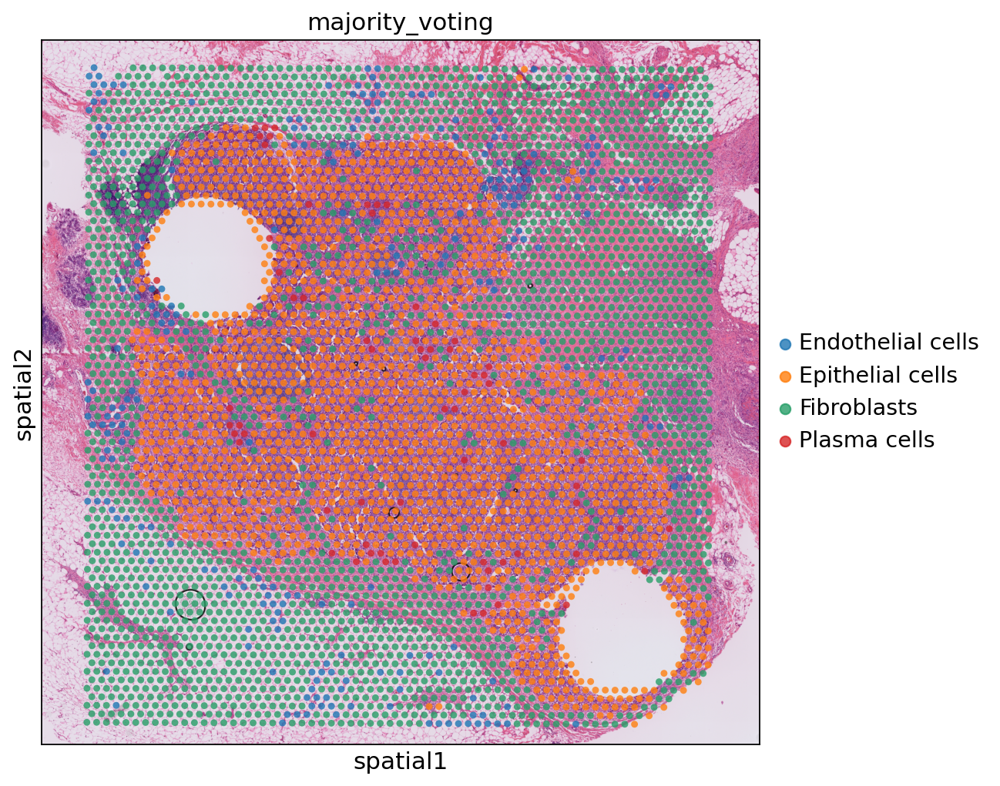

In [70]:
subset_adata = visium_samples['PRE-01']
# sq.pl.spatial_scatter(adata_test, color="majority_voting", alpha = 0.8)

subset_adata.obsm["spatial"]

nan_mask = np.isnan(subset_adata.obsm['spatial']).any(axis=1)
subset_adata_clean = subset_adata[~nan_mask].copy()  # Using '~' to negate the mask (keep only rows without NaNs)

sq.gr.spatial_neighbors(subset_adata_clean)
sq.gr.nhood_enrichment(subset_adata_clean, cluster_key="majority_voting")
sq.pl.nhood_enrichment(subset_adata_clean, cluster_key="majority_voting")

adata_test = visium_samples['PRE-01']
sq.pl.spatial_scatter(adata_test, color="majority_voting", alpha = 0.8)

In [59]:
adata_test = visium_samples['PRE-01']
adatas.obsm['spatial']

array([[7779., 9413.],
       [4455., 5965.],
       [6361., 6209.],
       ...,
       [4958., 1921.],
       [5342., 5816.],
       [ 363., 4531.]])

In [60]:
adata_test = visium_samples['PRE-02']
adatas.obsm['spatial']

array([[7779., 9413.],
       [4455., 5965.],
       [6361., 6209.],
       ...,
       [4958., 1921.],
       [5342., 5816.],
       [ 363., 4531.]])

... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


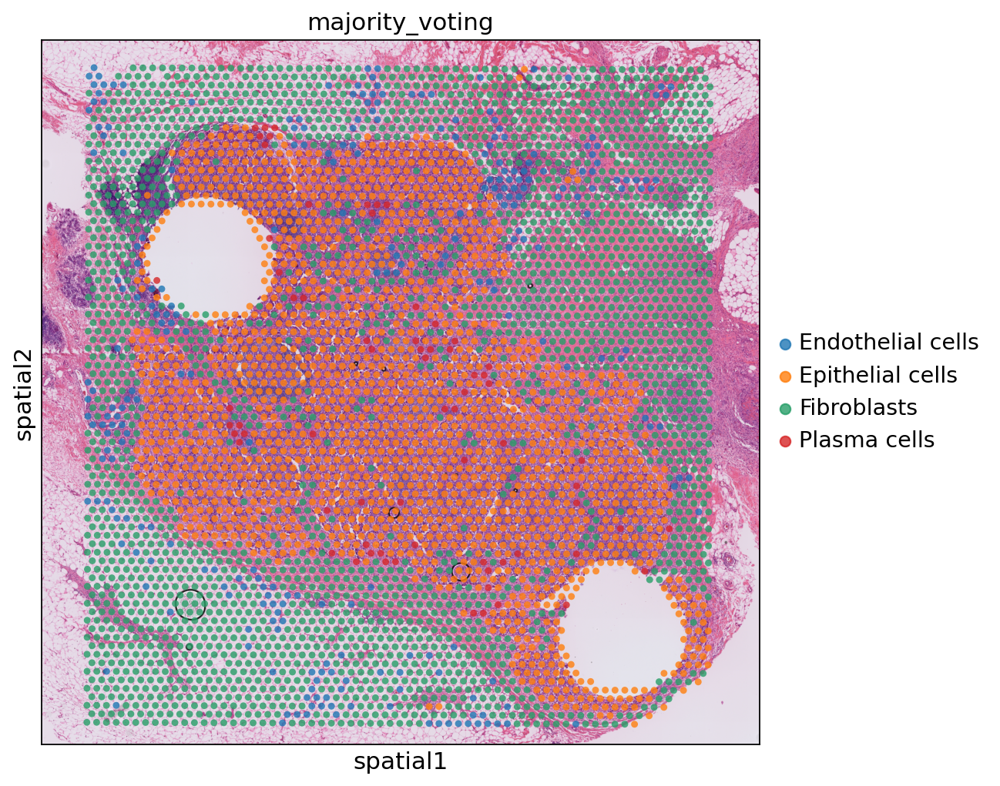

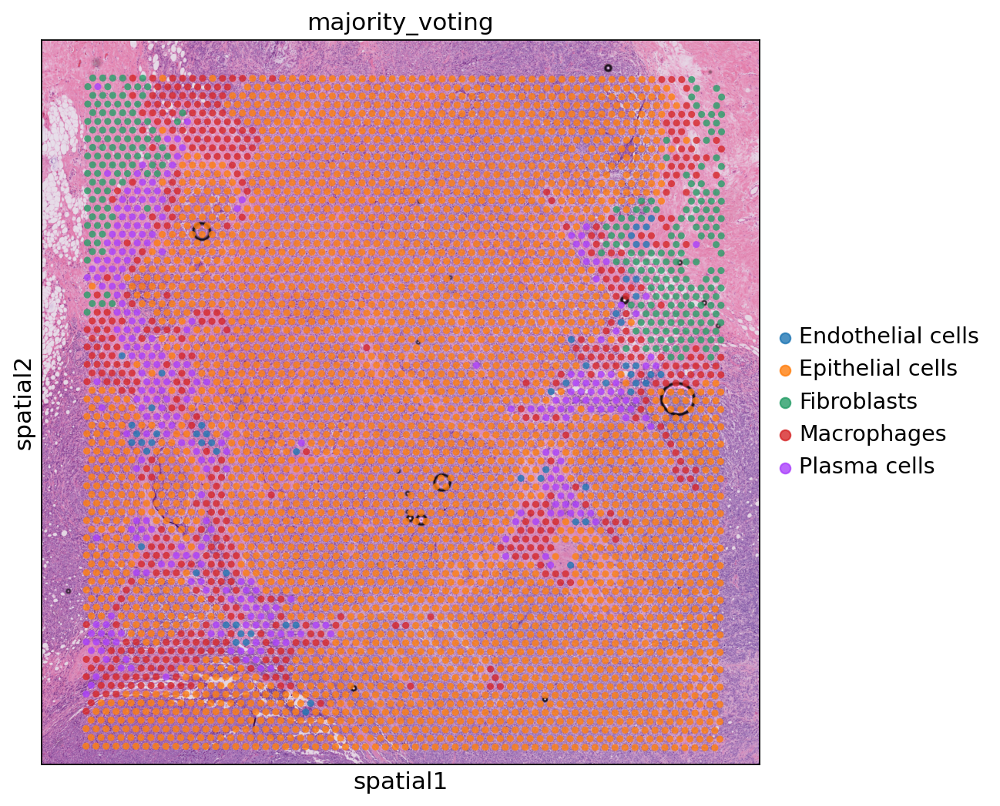

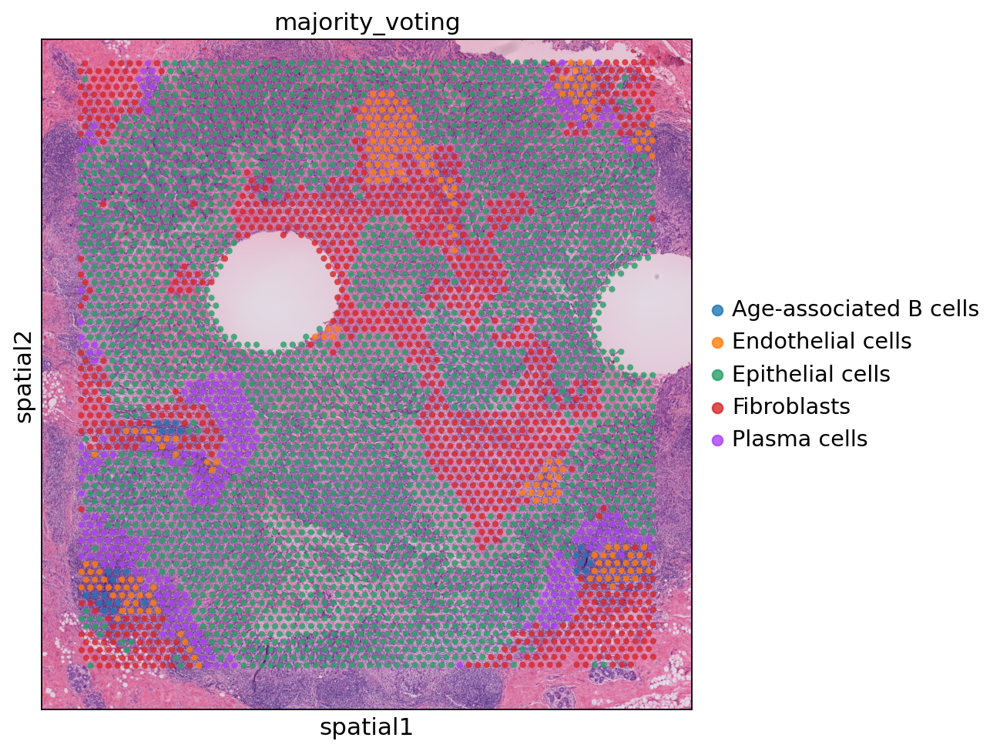

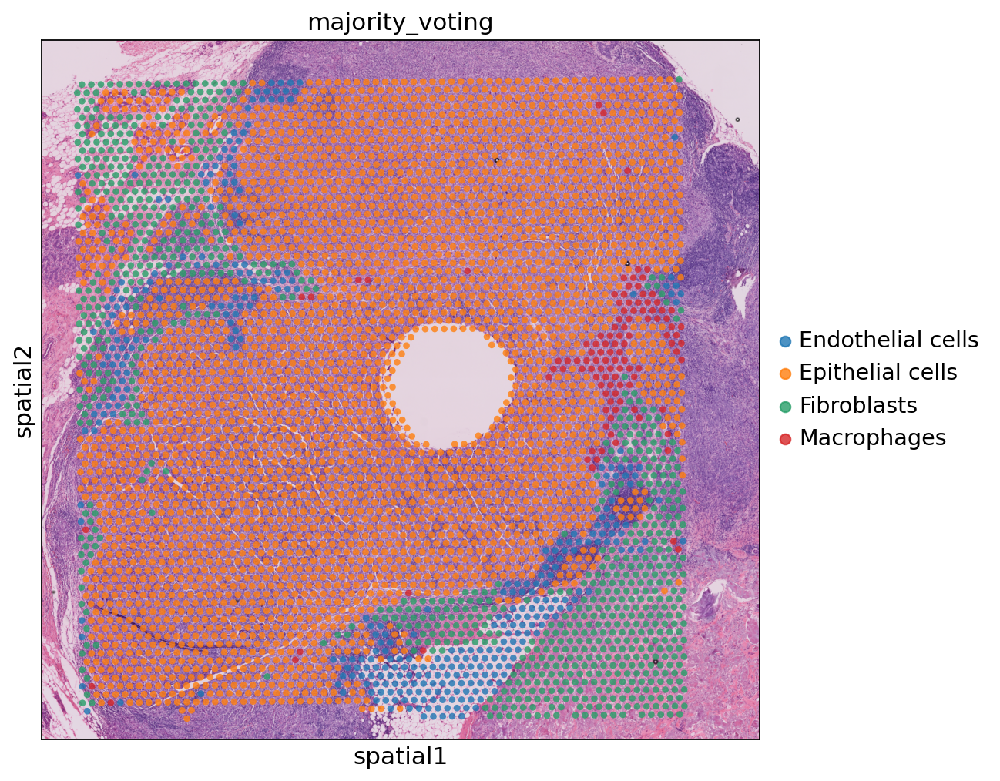

In [71]:
adata_test = visium_samples['PRE-01']
sq.pl.spatial_scatter(adata_test, color="majority_voting", alpha = 0.8)

adata_test = visium_samples['PRE-02']
sq.pl.spatial_scatter(adata_test, color="majority_voting", alpha = 0.8)

adata_test = visium_samples['PRE-04']
sq.pl.spatial_scatter(adata_test, color="majority_voting", alpha = 0.8)

adata_test = visium_samples['PRE-05']
sq.pl.spatial_scatter(adata_test, color="majority_voting", alpha = 0.8)